In [1]:
from PIL import Image
from skimage.io import imread, imshow, show
from scipy import ndimage, misc, signal, stats
# from scipy.stats import signaltonoise
# signaltonoise no longer available
# https://docs.scipy.org/doc/scipy/release.0.16.0.html?highlight=signaltonoise#deprecated-features
from skimage import data, img_as_float
from skimage.color import rgb2gray, rgba2rgb
from skimage.transform import rescale
import matplotlib.pylab as plt
import numpy as np
import numpy.fft as fp
import timeit

In [2]:
# Source: https://github.com/scipy/scipy/blob/v0.16.0/scipy/stats/stats.py#L1963
def signaltonoise(a, axis=0, ddof=0):
    """
    The signal-to-noise ratio of the input data.
    Returns the signal-to-noise ratio of `a`, here defined as the mean
    divided by the standard deviation.
    Parameters
    ----------
    a : array_like
        An array_like object containing the sample data.
    axis : int or None, optional
        Axis along which to operate. Default is 0. If None, compute over
        the whole array `a`.
    ddof : int, optional
        Degrees of freedom correction for standard deviation. Default is 0.
    Returns
    -------
    s2n : ndarray
        The mean to standard deviation ratio(s) along `axis`, or 0 where the
        standard deviation is 0.
    """
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m/sd)

46 60 4 uint8


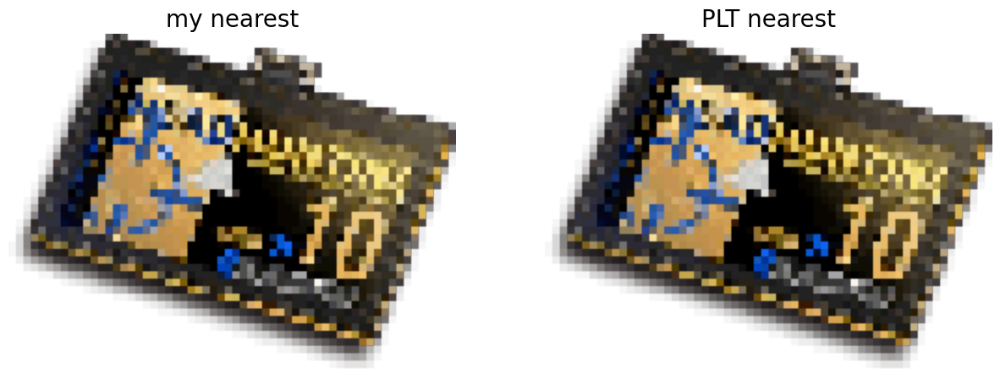

In [3]:
# nearest

im = imread("../images/Headhunt10_small.png")
row,col,chan = im.shape
print(row, col, chan, im.dtype)
scale = 3
im1 = np.ndarray(shape=(row*scale, col*scale, chan), dtype=im.dtype)

for i in range(row):
    for j in range(col):
        for di in range(scale):
            for dj in range(scale):
                im1[i*scale+di,j*scale+dj] = im[i][j]

im = Image.open("../images/Headhunt10_small.png")
im2 = im.resize((im.width*scale, im.height*scale), Image.Resampling.NEAREST)

plt.figure(figsize=(15,7))
plt.subplot(121), plt.imshow(im1), plt.axis(False), plt.title("my nearest", size=20)
plt.subplot(122), plt.imshow(im2), plt.axis(False), plt.title("PLT nearest", size=20)
plt.show()

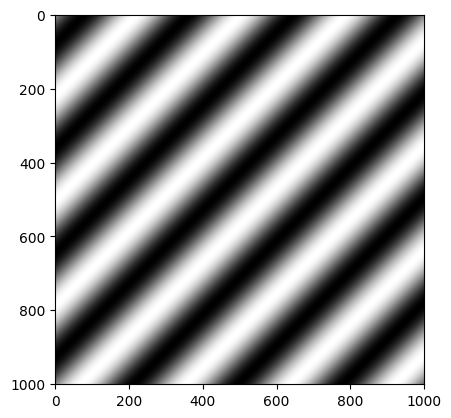

In [4]:
x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)
wavelength = 200
angle = np.pi / 4
grating = np.sin(
    2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / wavelength
)
plt.set_cmap("gray")
plt.imshow(grating)
plt.show()

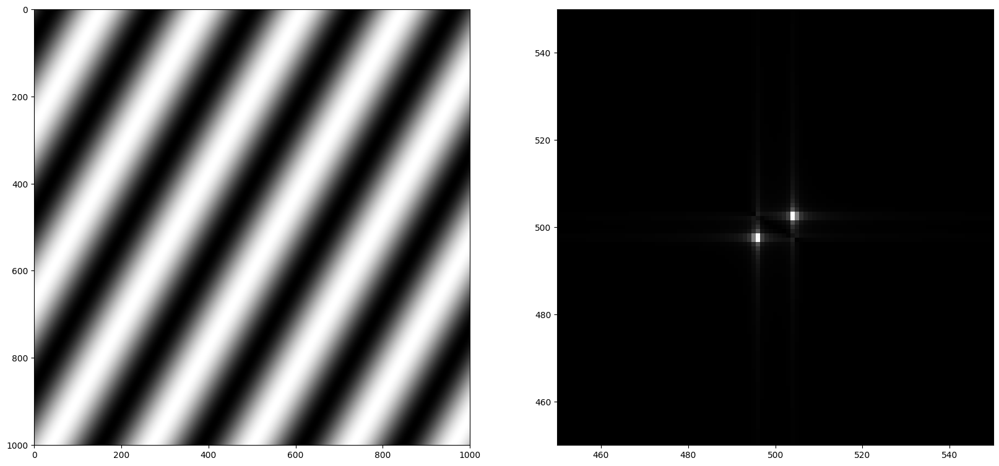

In [5]:
x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)
wavelength = 200
angle = np.deg2rad(30)
grating = np.sin(
    2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / wavelength
)
plt.figure(figsize=(20,20))
plt.set_cmap("gray")
plt.subplot(121)
plt.imshow(grating)
# Calculate Fourier transform of grating
ft = np.fft.ifftshift(grating)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)
plt.subplot(122)
plt.imshow(abs(ft))
plt.xlim([450,550])
plt.ylim([450,550])  # Note, order is reversed for y
plt.show()

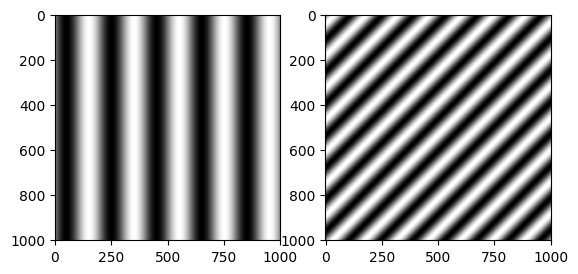

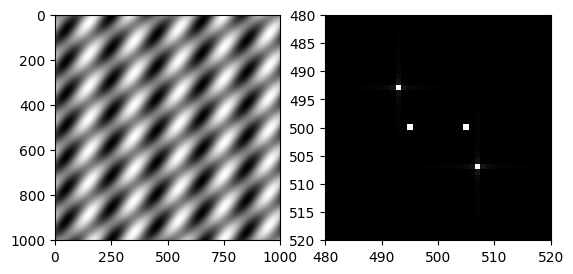

In [6]:
x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)
wavelength_1 = 200
angle_1 = 0
grating_1 = np.sin(
    2*np.pi*(X*np.cos(angle_1) + Y*np.sin(angle_1)) / wavelength_1
)
wavelength_2 = 100
angle_2 = np.deg2rad(45)
grating_2 = np.sin(
    2*np.pi*(X*np.cos(angle_2) + Y*np.sin(angle_2)) / wavelength_2
)
plt.set_cmap("gray")
plt.subplot(121)
plt.imshow(grating_1)
plt.subplot(122)
plt.imshow(grating_2)
plt.show()
gratings = grating_1 + grating_2
# Calculate Fourier transform of the sum of the two gratings
ft = np.fft.ifftshift(gratings)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)
plt.figure()
plt.subplot(121)
plt.imshow(gratings)
plt.subplot(122)
plt.imshow(abs(ft))
plt.xlim([480, 520])
plt.ylim([520, 480])  # Note, order is reversed for y
plt.show()

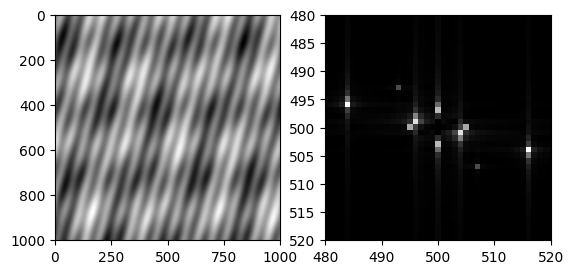

In [7]:
x = np.arange(-500, 501, 1)

X, Y = np.meshgrid(x, x)

amplitudes = [0.5, 0.25, 1, 0.75, 1]
wavelengths = [200, 100, 250, 300, 60]
angles = [0, np.deg2rad(45), np.deg2rad(20), np.deg2rad(90), np.deg2rad(15)]

gratings = np.zeros(X.shape)
for amp, w_len, angle in zip(amplitudes, wavelengths, angles):
    gratings += amp * np.sin(
        2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / w_len
    )

# Calculate Fourier transform of the sum of the gratings
ft = np.fft.ifftshift(gratings)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)

# Add a constant term to represent the background of image
gratings += 1.25

plt.set_cmap("gray")
plt.subplot(121)
plt.imshow(gratings)

plt.subplot(122)
plt.imshow(abs(ft))
plt.xlim([480, 520])
plt.ylim([520, 480])  # Note, order is reversed for y
plt.show()

SNR for the original image = 2.092231067206517
SNR for the image obtained after reconstruction = 2.0922310672065163


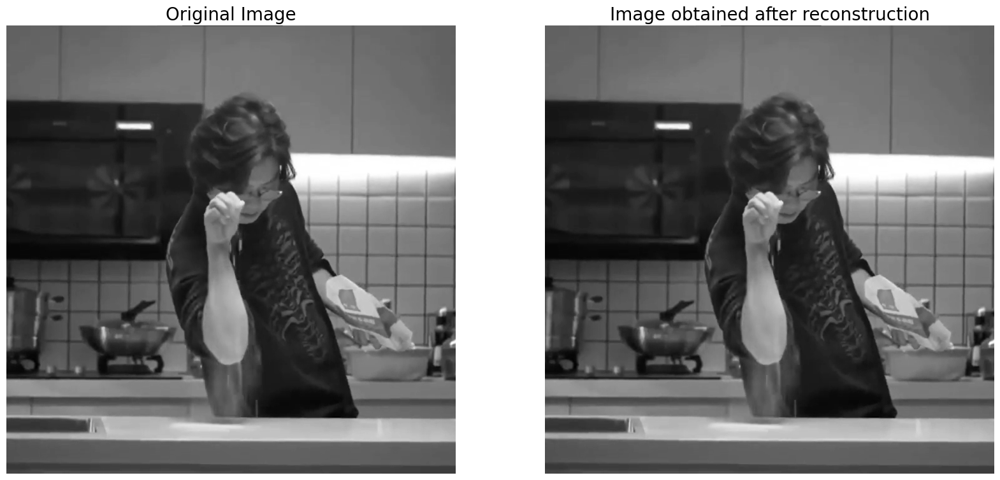

In [8]:
im = np.array(Image.open('../images/lowlight.png').convert('L')) # we shall work with grayscale image
snr = signaltonoise(im, axis=None)
print('SNR for the original image = ' + str(snr))
# SNR for the original image = 2.023722773801701
# now call FFT and IFFT
freq = fp.fft2(im)
im1 = fp.ifft2(freq).real
snr = signaltonoise(im1, axis=None)
print('SNR for the image obtained after reconstruction = ' + str(snr))
# SNR for the image obtained after reconstruction = 2.0237227738013224
assert(np.allclose(im, im1)) # make sure the forward and inverse FFT are close to each other
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.title('Original Image', size=20)
plt.subplot(122), plt.imshow(im1, cmap='gray'), plt.axis('off')
plt.title('Image obtained after reconstruction', size=20)
plt.show()

C:\Users\fpt\AppData\Local\Temp\ipykernel_17040\2439944976.py:2: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.figure(figsize=(10,10)), plt.imshow( (20*np.log10( 0.1 + freq2)).astype(int))


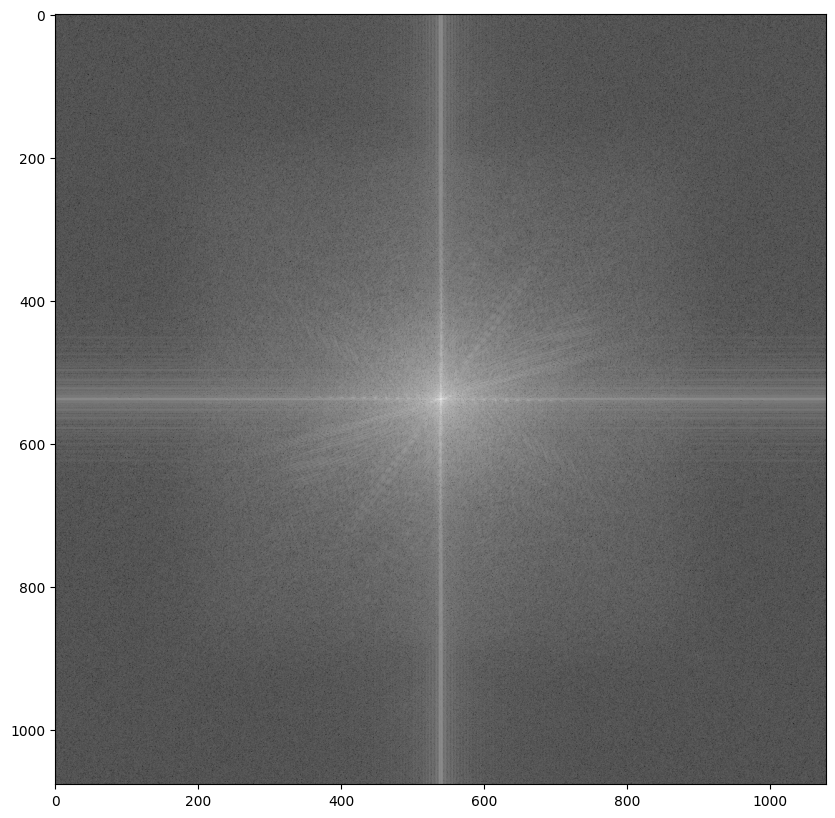

In [9]:
freq2 = fp.fftshift(freq)
plt.figure(figsize=(10,10)), plt.imshow( (20*np.log10( 0.1 + freq2)).astype(int))
plt.set_cmap("gray")
plt.show()

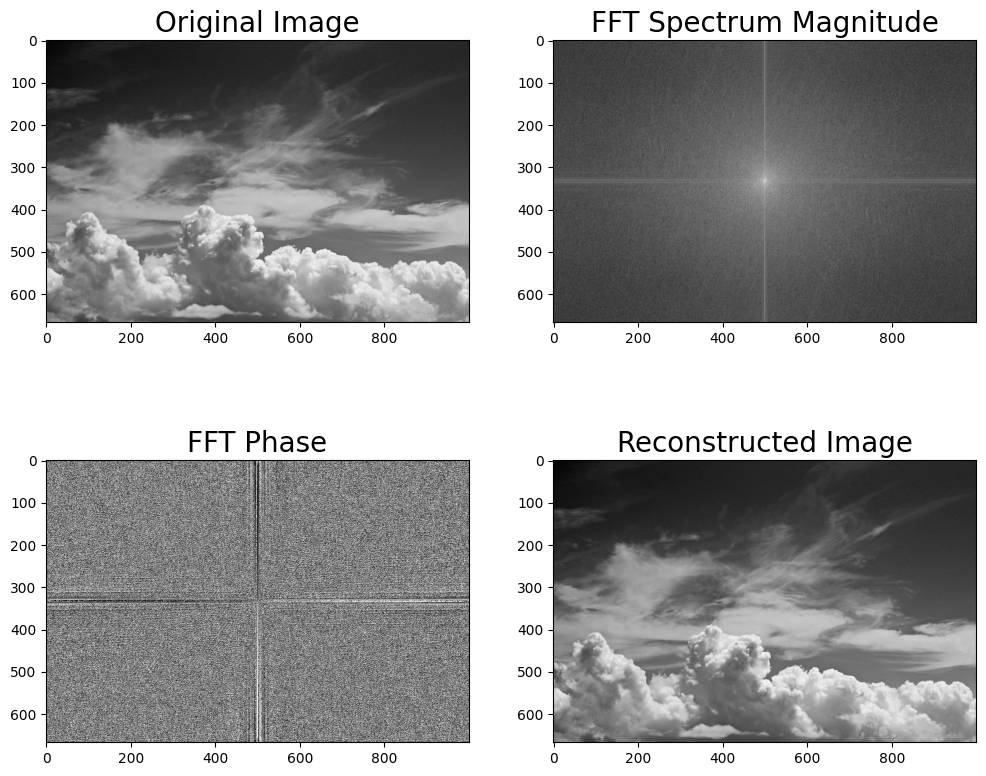

In [10]:
im1 = rgb2gray(imread('../images/sky.png'))
plt.figure(figsize=(12,10))
freq1 = fp.fft2(im1)
im1_ = fp.ifft2(freq1).real
plt.subplot(2,2,1), plt.imshow(im1, cmap='gray'), plt.title('Original Image', size=20)
plt.subplot(2,2,2), plt.imshow(20*np.log10( 0.01 + np.abs(fp.fftshift(freq1))), cmap='gray')
plt.title('FFT Spectrum Magnitude', size=20)
plt.subplot(2,2,3), plt.imshow(np.angle(fp.fftshift(freq1)), cmap='gray')
plt.title('FFT Phase', size=20)
plt.subplot(2,2,4), plt.imshow(np.clip(im1_,0,255), cmap='gray')
plt.title('Reconstructed Image', size=20)
plt.show()

2.092230796813965
2.09223107753901


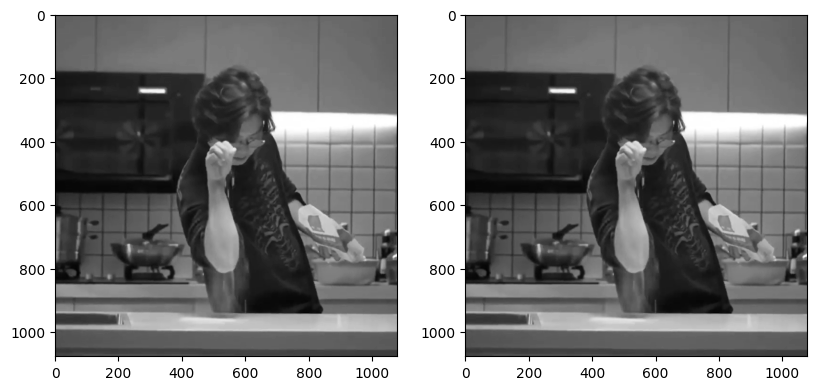

In [11]:
im = plt.imread("../images/lowlight.png")
snr = signaltonoise(im, axis=None)
print(str(snr))
plt.figure(figsize=(15,5))
plt.subplot(131), plt.imshow(im)
# ft = fp.fftshift(im)
ft = fp.fft2(im)
im1 = fp.ifft2(ft).real
# ft = fp.fftshift(ft)
snr = signaltonoise(im1, axis=None)
# assert(np.isclose(im,im1))
print(str(snr))
# plt.subplot(132), plt.imshow(20*np.log10( 0.01 + np.abs(fp.fftshift(freq1))))

plt.subplot(132), plt.imshow(im1)

plt.show()

1.0
(241, 242)


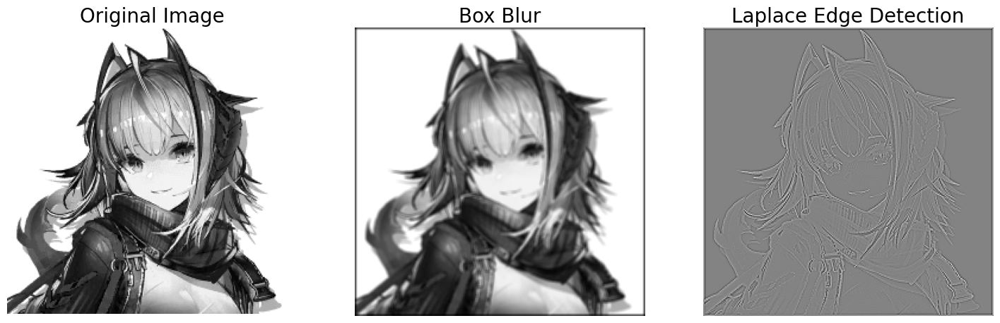

In [12]:
im = rgb2gray(rgba2rgb(imread('../images/w.png'))).astype(float)
print(np.max(im))
# 1.0
print(im.shape)
# (225, 225)
blur_box_kernel = np.ones((3,3)) / 9
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
# edge_laplace_kernel = np.array([[1,1,1],[1,-8,1],[1,1,1]])
im_blurred = signal.convolve2d(im, blur_box_kernel)
# im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)
im_edges = signal.convolve2d(im, edge_laplace_kernel)
fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(18, 6))
axes[0].imshow(im, cmap=plt.cm.gray)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_blurred, cmap=plt.cm.gray)
axes[1].set_title('Box Blur', size=20)
axes[2].imshow(im_edges, cmap=plt.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
plt.show()


1.0
(1500, 2666, 3)


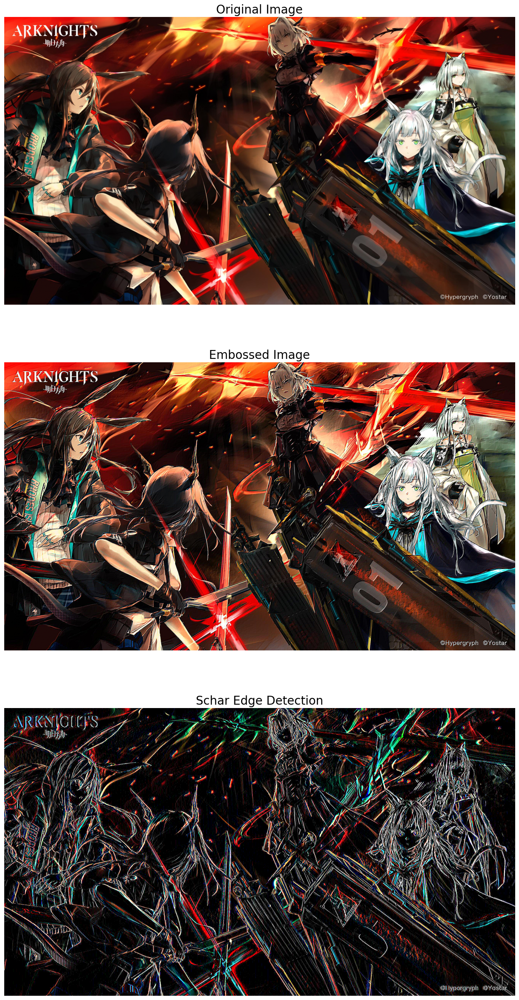

In [13]:
im = imread('../images/arknightsc8_small.jpg')/255 # scale each pixel value in [0,1]
print(np.max(im))
print(im.shape)
emboss_kernel = np.array([[-2,-1,0],[-1,1,1],[0,1,2]])
edge_schar_kernel = np.array([[ -3-3j, 0-10j, +3 -3j], [-10+0j, 0+ 0j, +10+0j], [ -3+3j, 0+10j, +3 +3j]])
im_embossed = np.full(im.shape, 420.69)
im_edges = np.full(im.shape, 69.420)
for i in range(3):
    im_embossed[...,i] = np.clip(signal.convolve2d(im[...,i], emboss_kernel, mode='same', boundary="symm"),0,1)
for i in range(3):
    im_edges[:,:,i] = np.clip(np.real(signal.convolve2d(im[...,i], edge_schar_kernel, mode='same', boundary="symm")),0,1)

fig, axes = plt.subplots(nrows=3, figsize=(20, 30))
axes[0].imshow(im)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_embossed)
axes[1].set_title('Embossed Image', size=20)
axes[2].imshow(im_edges)
axes[2].set_title('Schar Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
plt.show()


C:\Users\fpt\AppData\Local\Temp\ipykernel_17040\622466665.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = imread('../images/agent1.png').astype(np.float) # read as float


255.0


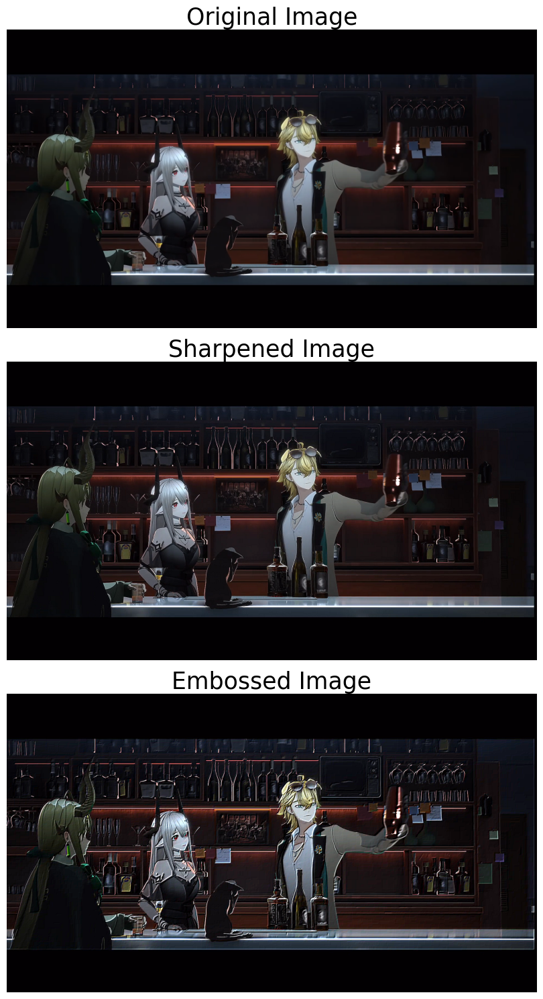

In [14]:
im = imread('../images/agent1.png').astype(np.float) # read as float
print(np.max(im))
sharpen_kernel = np.array([0, -1, 0, -1, 5, -1, 0, -1, 0]).reshape((3, 3, 1))
emboss_kernel = np.array(np.array([[-2,-1,0],[-1,1,1],[0,1,2]])).reshape((3, 3, 1))
im_sharp = ndimage.convolve(im, sharpen_kernel, mode='nearest')
im_sharp = np.clip(im_sharp, 0, 255).astype(np.uint8) # clip (0 to 255) andconvert to unsigned int
im_emboss = ndimage.convolve(im, emboss_kernel, mode='nearest')
im_emboss = np.clip(im_emboss, 0, 255).astype(np.uint8)
plt.figure(figsize=(10,15))
plt.subplot(311), plt.imshow(im.astype(np.uint8)), plt.axis('off')
plt.title('Original Image', size=25)
plt.subplot(312), plt.imshow(im_sharp), plt.axis('off')
plt.title('Sharpened Image', size=25)
plt.subplot(313), plt.imshow(im_emboss), plt.axis('off')
plt.title('Embossed Image', size=25)
plt.tight_layout()
plt.show()
